Image style transfer (передача нейронного стиля) - одна из задач, которую могут решать GAN-сети. Она заключается в передаче художественного стиля одного или нескольких изображений на другое изображение, фотографию. Методы передачи стиля могут широко использоваться в приложениях обработки изображений, таких как фильтры для мобильных камер. Одновременно с этим передача стилей является сложной задачей, поскольку в процессе обработки необъодимо явно разделить содержание от стиля исходного изображения. Примерами решения этой задачи могут быть:
- перевод летних пейзажей в зимние (и наоборот)
- передача стиля художника на фотографию (и наоборот)
- перевод картины в фотографию
- передача полосок зебры на лошадь и т.д.

Статьи, которые показались интересны:
- https://arxiv.org/pdf/1805.09987.pdf (Learning from Multi-domain Artistic Images for Arbitrary Style
Transfer)
- http://cs230.stanford.edu/projects_fall_2020/reports/55792990.pdf (Paint like Vincent Van Gogh: Artistic Style Generator Using CycleGAN and VGG19)

Для решения этой задачи одними из часто использующихся алгоритмов являются:
- CycleGAN, позволяет строить модель в условиях непарных сетов изображений. Впервые была описана Jun-Yan Zhu в 2017 году в статье “Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks” (https://arxiv.org/abs/1703.10593)

- VGG19, сверточная нейронная сеть с 19 слоями, также использующаяся при обычной классификации изображений. В данной задаче используется как FAST STYLE TRANSFER MODEL (ссылка на картинку https://miro.medium.com/max/1574/1*Um82GJ99gauIOh0U-S11hQ.png). На вход подаются изображения, они проходят через encoder и предсказывают сгенерированное изображение. Это сгенерированное изображение передается в модель потерь (VGG19), извлекаются фичи из разных слоев (лои контента и слои стилей), все это далее используется для взвешенного расчета потери стиля и потери контента, что и тренирует сеть.

Исходя из выводов, сделанных в статьях, CycleGAN более долго учится и результат в прикладной задаче переноса художественного стиля получился визуально несколько хуже, чем у быстрого переноса стиля с помощью сети VGG19. Она быстрее обучилась, результат получился более красивым.

###### Попробуем сделать быструю передачу стиля с помощью VGG19

In [1]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import vgg19
from tensorflow.keras.models import load_model,Model
from PIL import Image
import time
import matplotlib.pyplot as plt
import matplotlib
import requests
import base64
import os
from pathlib import Path
from io import BytesIO
matplotlib.rcParams['figure.figsize'] = (12,12)
matplotlib.rcParams['axes.grid'] = False

In [2]:
# Importing PlaidML - для подключения GPU
import os
import plaidml.keras

plaidml.keras.install_backend()
os.environ['KERAS BACKEND'] = "plaidml.keras.backend"
os.environ["PLAIDML_EXPERIMENTAL"] = "1"

# Load compressed models from tensorflow_hub
os.environ['TFHUB_MODEL_LOAD_FORMAT'] = 'COMPRESSED'

In [3]:
data_path = '/Users/mac/Documents/course_neuron/data/'

In [4]:
# В качестве стилей, которые будем переносить - одни из знаменитых работ художников:
# 1) Гоген 2) Монэ 3) Кандинский 4) Ван Гог

content = data_path+'/pic.jpeg'
style_1 = data_path+'/gauguin.jpeg'
style_2 = data_path+'/monet.jpeg'
style_3 = data_path+'/kandinsky.jpeg'
style_4 = data_path+'/vangogh.jpeg'

In [5]:
def load_image(image_path,dim=None,resize=False):
    img= Image.open(image_path)
    if dim:
        if resize:
            img=img.resize(dim)
        else:
            img.thumbnail(dim)
    img= img.convert("RGB")
    return np.array(img)

In [6]:
def show_image(image, title=None):
    if len(image.shape)>3:
        image=tf.squeeze(image,axis=0)
    plt.imshow(image)
    if title:
        plt.title=title
    plt.show()

In [7]:
def plot_images_grid(images, num_rows=1):
    n=len(images)
    if n > 1:
        num_cols=np.ceil(n/num_rows)
        fig,axes=plt.subplots(ncols=int(num_cols),nrows=int(num_rows))
        axes=axes.flatten()
        fig.set_size_inches((20,20))
        for i,image in enumerate(images):
            axes[i].axis('off')
            axes[i].imshow(image)
    else:
        plt.figure(figsize=(10,10))
        plt.imshow(images[0])

In [8]:
def load_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

In [9]:
content_image = load_image(content)
style_image_1 = load_image(style_1)
style_image_2 = load_image(style_2)
style_image_3 = load_image(style_3)
style_image_4 = load_image(style_4)

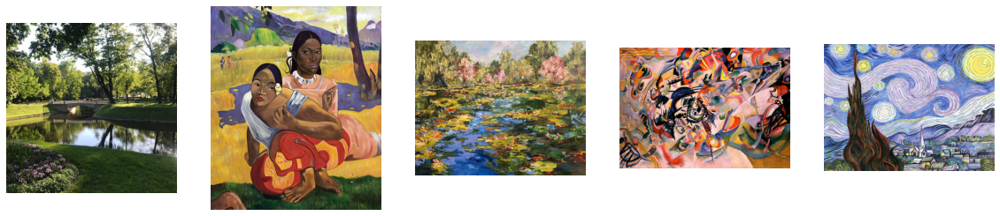

In [10]:
plot_images_grid((content_image, style_image_1, style_image_2, style_image_3, style_image_4),num_rows = 1)

### Передача стилей с использованием TF-Hub

In [11]:
# Попробуем использовать предобученную модель для передачи стиля, ее описание доступно также по ссылке ниже
import tensorflow_hub as hub
hub_model = hub.load('https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2')

In [12]:
def tensor_to_image(tensor):
    tensor = tensor*255
    tensor = np.array(tensor, dtype=np.uint8)
    if np.ndim(tensor)>3:
        assert tensor.shape[0] == 1
        tensor = tensor[0]
    return Image.fromarray(tensor)

In [13]:
def tf_img(path_to_img):
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)

    shape = tf.cast(tf.shape(img)[:-1], tf.float32)
    long_dim = max(shape)
    scale = max_dim / long_dim

    new_shape = tf.cast(shape * scale, tf.int32)

    img = tf.image.resize(img, new_shape)
    img = img[tf.newaxis, :]
    return img

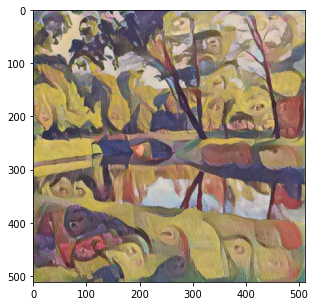

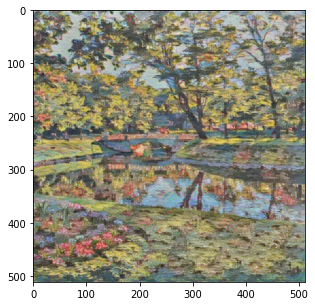

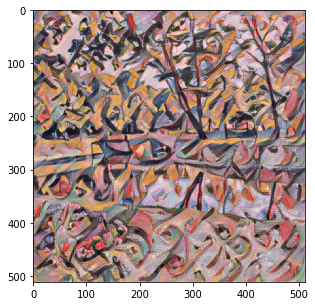

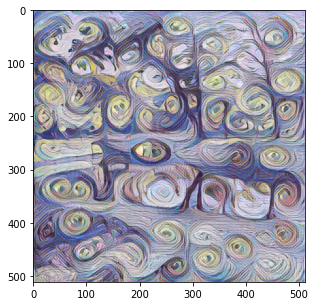

In [14]:
content_image = tf_img(content)
style_image_1 = tf_img(style_1)
style_image_2 = tf_img(style_2)
style_image_3 = tf_img(style_3)
style_image_4 = tf_img(style_4)

style_list = [style_image_1, style_image_2, style_image_3, style_image_4]
for style in style_list:
    stylized_image = hub_model(tf.constant(content_image), tf.constant(style))[0]
    img = tensor_to_image(stylized_image)
    # Рисуем на экран
    plt.figure(figsize=(16,5))
    plt.imshow(img) 
    plt.show()

Преднастроенная модель выдает узнаваемые результаты, находятся паттерны на изображениях и переносятся на исходное фото. В то же время, мало стиля остается от исходного фото, больший вес придается стилю художника.

### Передача стиля с использованием VGG19

Исходная картинка и картинка со стилем, который нужно применить, проходят через VGG19 сеть для выделения художественных фичей. Верхние слои модели предназначены для распознавания содержания картинки и запоминают общие черты, тогда как более глубокие слои предназначены для обучения на более мелких фичах. Для расчета content loss (потеря содержания) используются верхние слои модели, для style loss (потери стиля, границ, углов) - более глубокие слои.

In [15]:
# Импортируем модель
vgg=vgg19.VGG19(weights='imagenet',include_top=False)
vgg.summary()

Model: "vgg19"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, None, None, 3)]   0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, None, None, 64)    1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, None, None, 64)    36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, None, None, 64)    0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, None, None, 128)   73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, None, None, 128)   147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, None, None, 128)   0     

In [16]:
# Определяем за что отвечают слои
content_layers=['block4_conv2']
style_layers=['block1_conv1',
            'block2_conv1',
            'block3_conv1',
            'block4_conv1',
            'block5_conv1']
content_layers_weights=[1]
style_layers_weights=[1]*5

In [17]:
# Определяем общий лосс модели путем объединения потери стиля и потери контента
class LossModel:
    def __init__(self,pretrained_model,content_layers,style_layers):
        self.model=pretrained_model
        self.content_layers=content_layers
        self.style_layers=style_layers
        self.loss_model=self.get_model()

    def get_model(self):
        self.model.trainable=False
        layer_names=self.style_layers + self.content_layers
        outputs=[self.model.get_layer(name).output for name in layer_names]
        new_model=Model(inputs=self.model.input,outputs=outputs)
        return new_model
    
    def get_activations(self,inputs):
        inputs=inputs*255.0
        style_length=len(self.style_layers)
        outputs=self.loss_model(vgg19.preprocess_input(inputs))
        style_output,content_output=outputs[:style_length],outputs[style_length:]
        content_dict={name:value for name,value in zip(self.content_layers,content_output)}
        style_dict={name:value for name,value in zip(self.style_layers,style_output)}
        return {'content':content_dict,'style':style_dict}

In [18]:
loss_model=LossModel(vgg,content_layers,style_layers)

###### Определяем функции потерь и вспомогательные функции

In [19]:
def content_loss(placeholder,content,weight):
    assert placeholder.shape == content.shape
    return weight*tf.reduce_mean(tf.square(placeholder-content))

In [20]:
def gram_matrix(x):
    gram=tf.linalg.einsum('bijc,bijd->bcd', x, x)
    return gram/tf.cast(x.shape[1]*x.shape[2]*x.shape[3],tf.float32)

In [21]:
def style_loss(placeholder,style,weight):
    assert placeholder.shape == style.shape
    s=gram_matrix(style)
    p=gram_matrix(placeholder)
    return weight*tf.reduce_mean(tf.square(s-p))

In [22]:
def preceptual_loss(predicted_activations,content_activations,style_activations,content_weight,style_weight,content_layers_weights,style_layer_weights):
    pred_content=predicted_activations["content"]
    pred_style=predicted_activations["style"]
    c_loss=tf.add_n([content_loss(pred_content[name],content_activations[name],content_layers_weights[i]) for i,name in enumerate(pred_content.keys())])
    c_loss=c_loss*content_weight
    s_loss=tf.add_n([style_loss(pred_style[name],style_activations[name],style_layer_weights[i]) for i,name in enumerate(pred_style.keys())])
    s_loss=s_loss*style_weight
    return c_loss+s_loss

##### Определяем слои модели
- при обучении модели сгенерированная картинка проходит через модель
- извлекаются фичи (контента и стиля)
- затем эти фичи используются в расчете потерь (контента и стиля)
- потери взвешиваются для получения общей потери восприятия (perceptual loss)
- модель тренируется 

In [23]:
class ReflectionPadding2D(tf.keras.layers.Layer):
    def __init__(self, padding=(1, 1), **kwargs):
        super(ReflectionPadding2D, self).__init__(**kwargs)
        self.padding = tuple(padding)
    def call(self, input_tensor):
        padding_width, padding_height = self.padding
        return tf.pad(input_tensor, [[0,0], [padding_height, padding_height], [padding_width, padding_width], [0,0] ], 'REFLECT')

In [24]:
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self,**kwargs):
        super(InstanceNormalization, self).__init__(**kwargs)
    def call(self,inputs):
        batch, rows, cols, channels = [i for i in inputs.get_shape()]
        mu, var = tf.nn.moments(inputs, [1,2], keepdims=True)
        shift = tf.Variable(tf.zeros([channels]))
        scale = tf.Variable(tf.ones([channels]))
        epsilon = 1e-3
        normalized = (inputs-mu)/tf.sqrt(var + epsilon)
        return scale * normalized + shift

In [25]:
class ConvLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,strides=1,**kwargs):
        super(ConvLayer,self).__init__(**kwargs)
        self.padding=ReflectionPadding2D([k//2 for k in kernel_size])
        self.conv2d=tf.keras.layers.Conv2D(filters,kernel_size,strides)
        self.bn=InstanceNormalization()
    def call(self,inputs):
        x=self.padding(inputs)
        x=self.conv2d(x)
        x=self.bn(x)
        return x

In [26]:
class ResidualLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,**kwargs):
        super(ResidualLayer,self).__init__(**kwargs)
        self.conv2d_1=ConvLayer(filters,kernel_size)
        self.conv2d_2=ConvLayer(filters,kernel_size)
        self.relu=tf.keras.layers.ReLU()
        self.add=tf.keras.layers.Add()
    def call(self,inputs):
        residual=inputs
        x=self.conv2d_1(inputs)
        x=self.relu(x)
        x=self.conv2d_2(x)
        x=self.add([x,residual])
        return x

In [27]:
class UpsampleLayer(tf.keras.layers.Layer):
    def __init__(self,filters,kernel_size,strides=1,upsample=2,**kwargs):
        super(UpsampleLayer,self).__init__(**kwargs)
        self.upsample=tf.keras.layers.UpSampling2D(size=upsample)
        self.padding=ReflectionPadding2D([k//2 for k in kernel_size])
        self.conv2d=tf.keras.layers.Conv2D(filters,kernel_size,strides)
        self.bn=InstanceNormalization()
    def call(self,inputs):
        x=self.upsample(inputs)
        x=self.padding(x)
        x=self.conv2d(x)
        return self.bn(x)

In [28]:
# Архитекура модели по слоям

class StyleTransferModel(tf.keras.Model):
    def __init__(self,**kwargs):
        super(StyleTransferModel, self).__init__(name='StyleTransferModel',**kwargs)
        self.conv2d_1= ConvLayer(filters=32,kernel_size=(9,9),strides=1,name="conv2d_1_32")
        self.conv2d_2= ConvLayer(filters=64,kernel_size=(3,3),strides=2,name="conv2d_2_64")
        self.conv2d_3= ConvLayer(filters=128,kernel_size=(3,3),strides=2,name="conv2d_3_128")
        self.res_1=ResidualLayer(filters=128,kernel_size=(3,3),name="res_1_128")
        self.res_2=ResidualLayer(filters=128,kernel_size=(3,3),name="res_2_128")
        self.res_3=ResidualLayer(filters=128,kernel_size=(3,3),name="res_3_128")
        self.res_4=ResidualLayer(filters=128,kernel_size=(3,3),name="res_4_128")
        self.res_5=ResidualLayer(filters=128,kernel_size=(3,3),name="res_5_128")
        self.deconv2d_1= UpsampleLayer(filters=64,kernel_size=(3,3),name="deconv2d_1_64")
        self.deconv2d_2= UpsampleLayer(filters=32,kernel_size=(3,3),name="deconv2d_2_32")
        self.deconv2d_3= ConvLayer(filters=3,kernel_size=(9,9),strides=1,name="deconv2d_3_3")
        self.relu=tf.keras.layers.ReLU()
    def call(self, inputs):
        x=self.conv2d_1(inputs)
        x=self.relu(x)
        x=self.conv2d_2(x)
        x=self.relu(x)
        x=self.conv2d_3(x)
        x=self.relu(x)
        x=self.res_1(x)
        x=self.res_2(x)
        x=self.res_3(x)
        x=self.res_4(x)
        x=self.res_5(x)
        x=self.deconv2d_1(x)
        x=self.relu(x)
        x=self.deconv2d_2(x)
        x=self.relu(x)
        x=self.deconv2d_3(x)
        x = (tf.nn.tanh(x) + 1) * (255.0 / 2)
        return x
    
    ## used to print shapes of each layer to check if input shape == output shape
    def print_shape(self,inputs):
        print(inputs.shape)
        x=self.conv2d_1(inputs)
        print(x.shape)
        x=self.relu(x)
        x=self.conv2d_2(x)
        print(x.shape)
        x=self.relu(x)
        x=self.conv2d_3(x)
        print(x.shape)
        x=self.relu(x)
        x=self.res_1(x)
        print(x.shape)
        x=self.res_2(x)
        print(x.shape)
        x=self.res_3(x)
        print(x.shape)
        x=self.res_4(x)
        print(x.shape)
        x=self.res_5(x)
        print(x.shape)
        x=self.deconv2d_1(x)
        print(x.shape)
        x=self.relu(x)
        x=self.deconv2d_2(x)
        print(x.shape)
        x=self.relu(x)
        x=self.deconv2d_3(x)
        print(x.shape)

In [29]:
# batch_size зависит от того, сколько картинок на вход
input_shape=(256,256,3)
batch_size=4

In [30]:
style_model = StyleTransferModel()

In [31]:
style_model.print_shape(tf.zeros(shape=(1,*input_shape)))

(1, 256, 256, 3)
(1, 256, 256, 32)
(1, 128, 128, 64)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 64, 64, 128)
(1, 128, 128, 64)
(1, 256, 256, 32)
(1, 256, 256, 3)


In [32]:
# Выбираем стандартный optimizer Адам
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

In [33]:
def train_step(dataset,style_activations,steps_per_epoch,style_model,loss_model,optimizer,checkpoint_path="./",content_weight=1e4,style_weight=1e-2,total_variation_weight=0.004,content_layers_weights=[1],style_layers_weights=[1]*5):
    batch_losses=[]
    steps=1
    save_path=os.path.join(checkpoint_path,f"model_checkpoint.ckpt")
    print("Model Checkpoint Path: ",save_path)
    for input_image_batch in dataset:
        if steps-1 >= steps_per_epoch:
            break
        with tf.GradientTape() as tape:
            outputs=style_model(input_image_batch)
            outputs=tf.clip_by_value(outputs, 0, 255)
            pred_activations=loss_model.get_activations(outputs/255.0)
            content_activations=loss_model.get_activations(input_image_batch)["content"] 
            curr_loss=preceptual_loss(pred_activations,content_activations,style_activations,content_weight,
                                      style_weight,content_layers_weights,style_layers_weights)
            curr_loss += total_variation_weight*tf.image.total_variation(outputs)
        batch_losses.append(curr_loss)
        grad = tape.gradient(curr_loss,style_model.trainable_variables)
        optimizer.apply_gradients(zip(grad,style_model.trainable_variables))
        if steps%100==0:
            print("checkpoint saved ",end=" ")
            style_model.save_weights(save_path)
            print(f"Loss: {tf.reduce_mean(batch_losses).numpy()}")
        steps+=1
    return tf.reduce_mean(batch_losses)

In [34]:
# Создаем класс для импорта картинок
class TensorflowDatasetLoader:
    def __init__(self,dataset_path,batch_size=4, image_size=(256, 256),num_images=None):
        images_paths = [str(path) for path in Path(dataset_path).glob("*.jpeg")]
        self.length=len(images_paths)
        if num_images is not None:
            images_paths = images_paths[0:num_images]
        dataset = tf.data.Dataset.from_tensor_slices(images_paths).map(
            lambda path: self.load_tf_image(path, dim=image_size),
            num_parallel_calls=tf.data.experimental.AUTOTUNE,
        )
        dataset = dataset.batch(batch_size,drop_remainder=True)
        dataset = dataset.repeat()
        dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
        self.dataset=dataset
    def __len__(self):
        return self.length
    def load_tf_image(self,image_path,dim):
        image = tf.io.read_file(image_path)
        image = tf.image.decode_jpeg(image, channels=3)
        image= tf.image.resize(image,dim)
        image= image/255.0
        image = tf.image.convert_image_dtype(image, tf.float32)
        return image

In [35]:
# Путь к папкам с картинками
input_path = data_path+"vgg19_photo"
style_path = data_path+"vgg19_style"

In [36]:
# Импортируем
loader=TensorflowDatasetLoader(input_path,batch_size=batch_size)

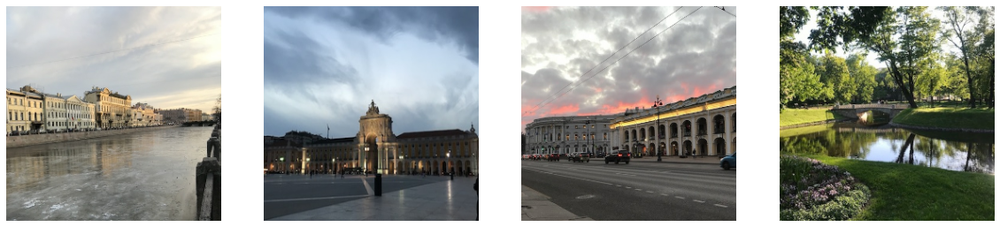

In [37]:
# Исходные картинки, они заранее сжаты в размере
plot_images_grid(next(iter(loader.dataset.take(1))),num_rows=1)

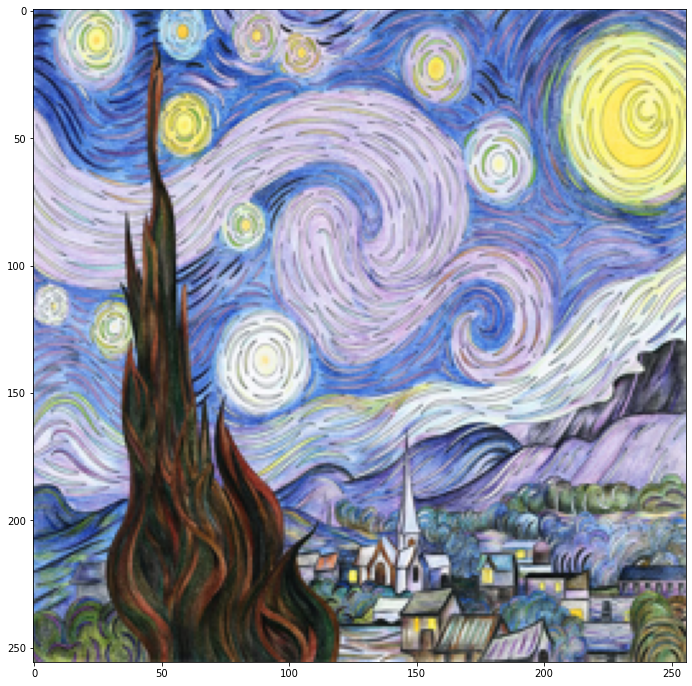

In [38]:
# Картинка стиля, который будем применять
style_image_path =os.path.join(style_path,"vangogh.jpeg")
style_image=load_image(style_image_path,dim=(input_shape[0],input_shape[1]),resize=True)
style_image=style_image/255.0
show_image(style_image)

In [39]:
style_image=style_image.astype(np.float32)
style_image_batch=np.repeat([style_image],batch_size,axis=0)
style_activations=loss_model.get_activations(style_image_batch)["style"]

In [40]:
epochs=200
content_weight=2*1e1
style_weight=1e2
total_variation_weight=0.004

In [41]:
num_images=len(loader)
steps_per_epochs=num_images//batch_size
print(steps_per_epochs)

1


In [35]:
model_save_path="model_checkpoint"
os.makedirs(model_save_path,exist_ok=True)

In [36]:
try:
    policy = tf.keras.mixed_precision.experimental.Policy('mixed_float16')
    tf.keras.mixed_precision.experimental.set_policy(policy) 
except:
    pass

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once
Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


In [37]:
try:
    tf.config.optimizer.set_jit(True)
except:
    pass

In [38]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("resuming training ...")
else:
    print("training scratch ...")

resuming training ...


In [39]:
epoch_losses=[]
for epoch in range(1,epochs+1):
    print(f"epoch: {epoch}")
    batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
    style_model.save_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Model Checkpointed at: ",os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print(f"loss: {batch_loss.numpy()}")
    epoch_losses.append(batch_loss)

epoch: 1
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 68107880.0
epoch: 2
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 88643992.0
epoch: 3
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 56977600.0
epoch: 4
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 55822744.0
epoch: 5
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 50306288.0
epoch: 6
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 43544480.0
epoch: 7
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpoint

Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 20055914.0
epoch: 56
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19896684.0
epoch: 57
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19846974.0
epoch: 58
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19770316.0
epoch: 59
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19695328.0
epoch: 60
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19577718.0
epoch: 61
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 19551472.0
ep

Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16720078.0
epoch: 110
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16668392.0
epoch: 111
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16617224.0
epoch: 112
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16594285.0
epoch: 113
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16627130.0
epoch: 114
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 16696526.0
epoch: 115
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 1674327

Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15731042.0
epoch: 164
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15782288.0
epoch: 165
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15358621.0
epoch: 166
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15253343.0
epoch: 167
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15472989.0
epoch: 168
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 15256007.0
epoch: 169
Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint/model_checkpoint.ckpt
loss: 1603832

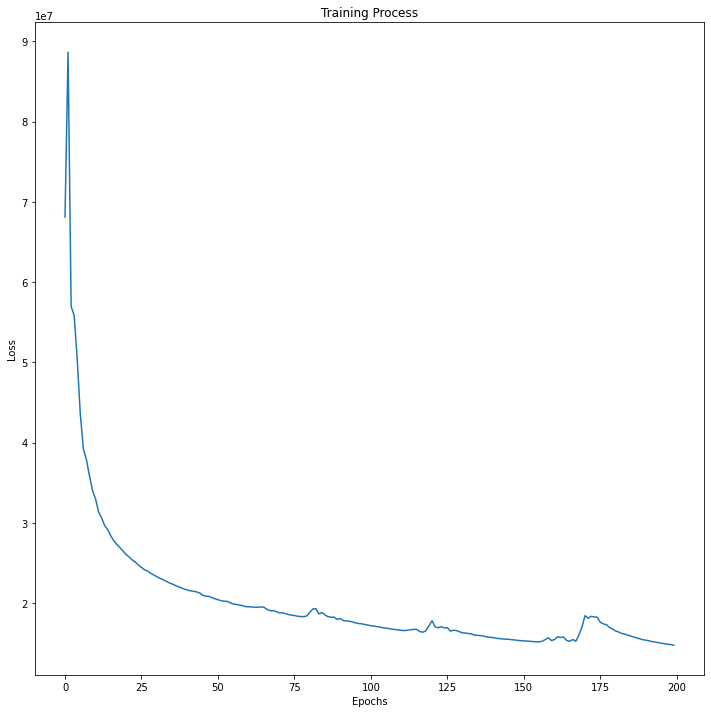

In [40]:
plt.plot(epoch_losses)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Training Process")
plt.show()

In [41]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("loading weights ...")
else:
    print("no weights found ...")

loading weights ...


In [42]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

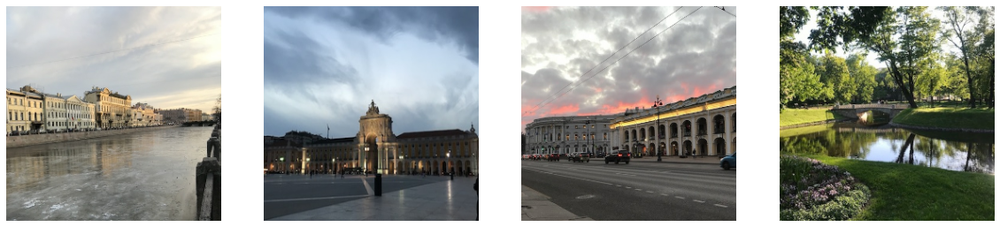

In [43]:
# Исходные фото
plot_images_grid(next(iter(loader.dataset.take(1))),num_rows = 1)

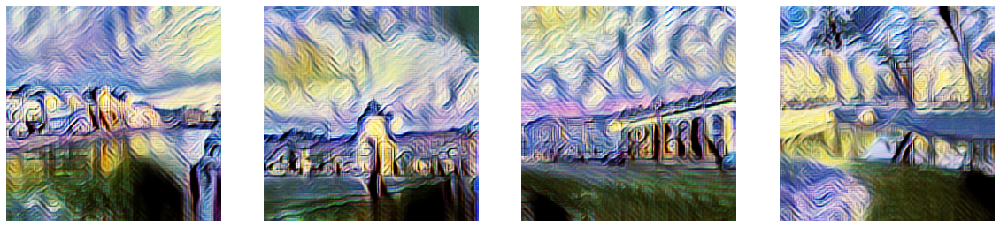

In [44]:
# Получившиеся при применении стиля
plot_images_grid(styled_images,num_rows = 1)

In [127]:
style_model.summary()

Model: "StyleTransferModel"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1_32 (ConvLayer)      multiple                  7808      
_________________________________________________________________
conv2d_2_64 (ConvLayer)      multiple                  18496     
_________________________________________________________________
conv2d_3_128 (ConvLayer)     multiple                  73856     
_________________________________________________________________
res_1_128 (ResidualLayer)    multiple                  295168    
_________________________________________________________________
res_2_128 (ResidualLayer)    multiple                  295168    
_________________________________________________________________
res_3_128 (ResidualLayer)    multiple                  295168    
_________________________________________________________________
res_4_128 (ResidualLayer)    multiple           

#### Применим веса из контрольной точки и применим на другой картине

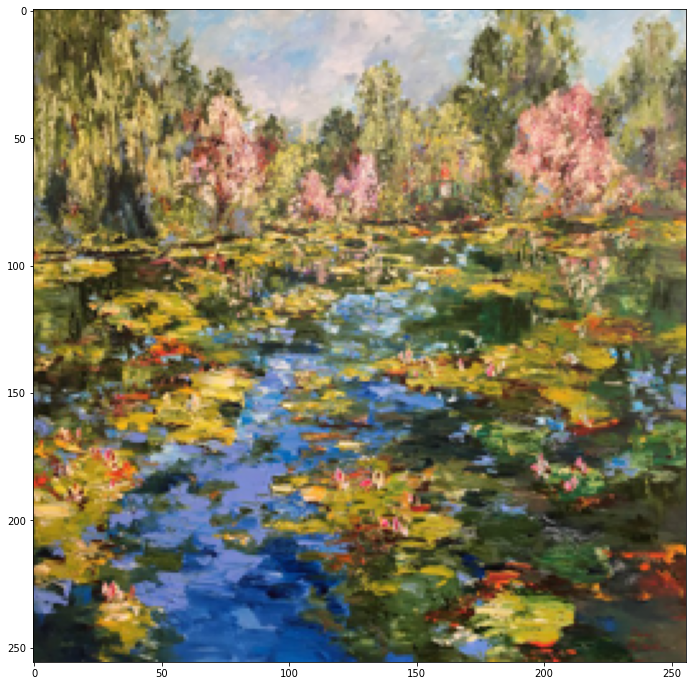

In [120]:
# Картинка стиля, который будем применять - Монэ
style_image_path =os.path.join(style_path,"monet.jpeg")
style_image=load_image(style_image_path,dim=(input_shape[0],input_shape[1]),resize=True)
style_image=style_image/255.0
show_image(style_image)

In [121]:
style_image=style_image.astype(np.float32)
style_image_batch=np.repeat([style_image],batch_size,axis=0)
style_activations=loss_model.get_activations(style_image_batch)["style"]

In [122]:
# Loads the weights
model_save_path="model_checkpoint"
style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))

In [123]:
steps_per_epochs = 1
batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
print(f"loss: {batch_loss.numpy()}")

Model Checkpoint Path:  model_checkpoint/model_checkpoint.ckpt
loss: 138671680.0


In [124]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

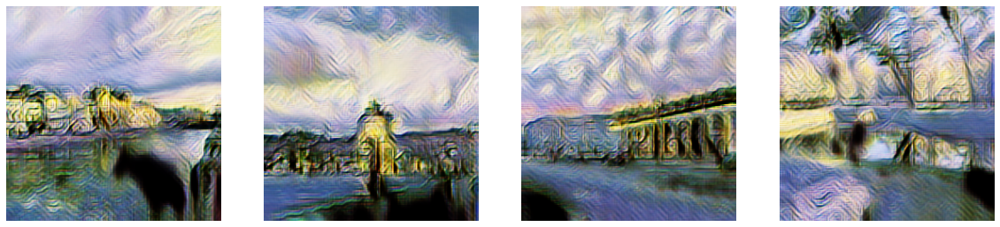

In [125]:
# Получившиеся картинки при применении стиля Моне с весами из модели, обучившейся на Ван Гоге
# Отличаются более светлыми тонами как у Моне, но чтобы получился другой стиль, необходимо переобучить модель
plot_images_grid(styled_images,num_rows = 1)

#### Переобучим модель с теми же параметрами

In [128]:
# Снизим кол-во эпох
epochs=100
content_weight=2*1e1
style_weight=1e2
total_variation_weight=0.004

In [129]:
num_images=len(loader)
steps_per_epochs=num_images//batch_size
print(steps_per_epochs)

1


In [130]:
model_save_path="model_checkpoint_1"
os.makedirs(model_save_path,exist_ok=True)

In [131]:
try:
    policy = tf.keras.mixed_precision.experimental.Policy('mixed_float16')
    tf.keras.mixed_precision.experimental.set_policy(policy) 
except:
    pass

The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


In [132]:
try:
    tf.config.optimizer.set_jit(True)
except:
    pass

In [133]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("resuming training ...")
else:
    print("training scratch ...")

training scratch ...


In [134]:
epoch_losses=[]
for epoch in range(1,epochs+1):
    print(f"epoch: {epoch}")
    batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
    style_model.save_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Model Checkpointed at: ",os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print(f"loss: {batch_loss.numpy()}")
    epoch_losses.append(batch_loss)

epoch: 1
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 53937480.0
epoch: 2
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 48825384.0
epoch: 3
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 42239528.0
epoch: 4
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 34691588.0
epoch: 5
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 29164570.0
epoch: 6
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 25269256.0
epoch: 7
Model Checkpoint Path:  model_checkpoint_1/model_checkp

Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 9982328.0
epoch: 54
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 10007258.0
epoch: 55
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 10223785.0
epoch: 56
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 10200052.0
epoch: 57
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 10109516.0
epoch: 58
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.ckpt
loss: 9628858.0
epoch: 59
Model Checkpoint Path:  model_checkpoint_1/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_1/model_checkpoint.

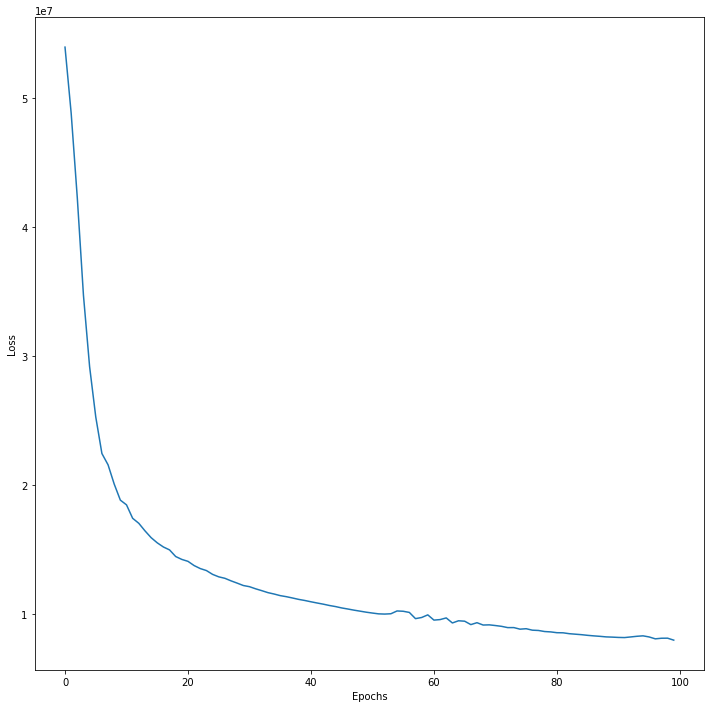

In [142]:
plt.plot(epoch_losses)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [137]:
if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("loading weights ...")
else:
    print("no weights found ...")

loading weights ...


In [138]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

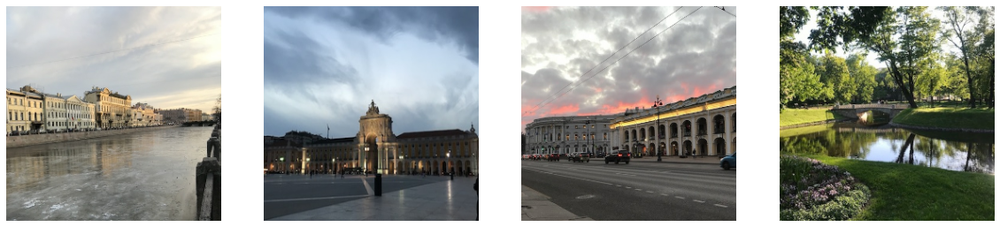

In [139]:
# Исходные фото
plot_images_grid(next(iter(loader.dataset.take(1))),num_rows = 1)

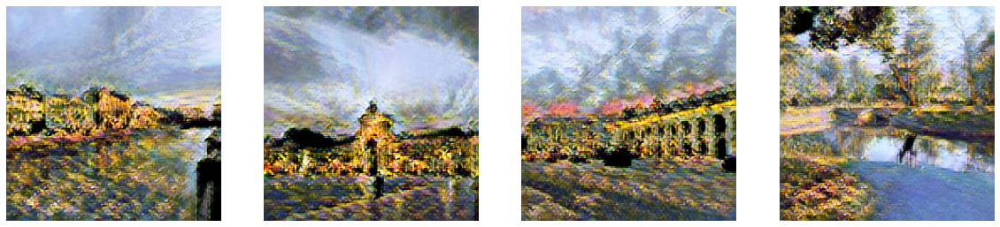

In [140]:
# Получившиеся при применении стиля
plot_images_grid(styled_images,num_rows = 1)

#### Изменим параметры на меньшем кол-ве эпох

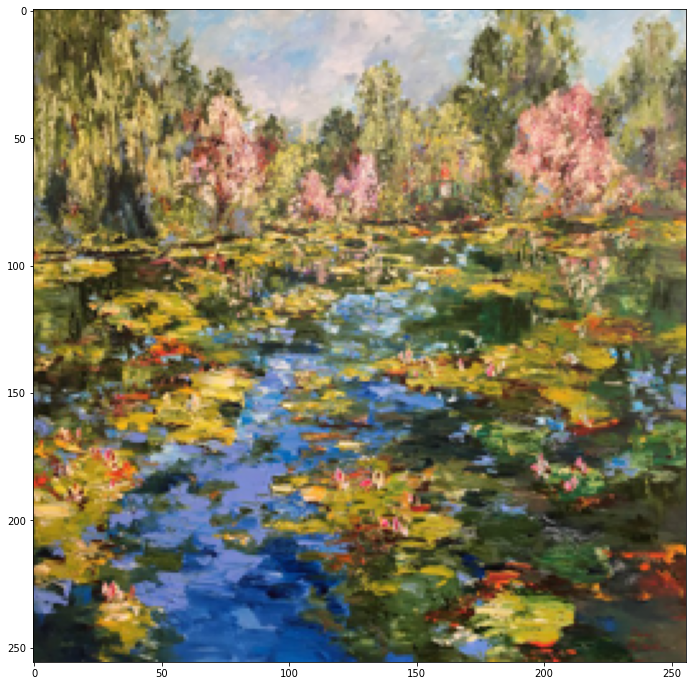

In [89]:
# Картинка стиля, который будем применять
style_image_path =os.path.join(style_path,"monet.jpeg")
style_image=load_image(style_image_path,dim=(input_shape[0],input_shape[1]),resize=True)
style_image=style_image/255.0
show_image(style_image)

style_image=style_image.astype(np.float32)
style_image_batch=np.repeat([style_image],batch_size,axis=0)
style_activations=loss_model.get_activations(style_image_batch)["style"]

In [90]:
optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)

In [93]:
# Оставим кол-во эпох, увеличим total_variation_weight
epochs=100
content_weight=2*1e1
style_weight=1e2
# total_var_weight = [0.004, 0.05, 1, 3]
total_variation_weight=0.05

num_images=len(loader)
steps_per_epochs=num_images//batch_size
print(steps_per_epochs)

1


In [94]:
model_save_path="model_checkpoint_2"
os.makedirs(model_save_path,exist_ok=True)

In [95]:
try:
    tf.config.optimizer.set_jit(True)
except:
    pass


if os.path.isfile(os.path.join(model_save_path,"model_checkpoint.ckpt.index")):
    style_model.load_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("resuming training ...")
else:
    print("training scratch ...")
    
try:
    policy = tf.keras.mixed_precision.experimental.Policy('mixed_float16')
    tf.keras.mixed_precision.experimental.set_policy(policy) 
except:
    pass

resuming training ...
The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


The dtype policy mixed_float16 may run slowly because this machine does not have a GPU. Only Nvidia GPUs with compute capability of at least 7.0 run quickly with mixed_float16.
If you will use compatible GPU(s) not attached to this host, e.g. by running a multi-worker model, you can ignore this warning. This message will only be logged once


Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


Instructions for updating:
Use tf.keras.mixed_precision.LossScaleOptimizer instead. LossScaleOptimizer now has all the functionality of DynamicLossScale


In [96]:
epoch_losses=[]
for epoch in range(1,epochs+1):
    print(f"epoch: {epoch}")
    batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
    style_model.save_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Model Checkpointed at: ",os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print(f"loss: {batch_loss.numpy()}")
    epoch_losses.append(batch_loss)

epoch: 1
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 19787488.0
epoch: 2
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 283972736.0
epoch: 3
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 85880336.0
epoch: 4
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 72384544.0
epoch: 5
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 67563976.0
epoch: 6
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 63114416.0
epoch: 7
Model Checkpoint Path:  model_checkpoint_2/model_check

Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 14392653.0
epoch: 54
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 14283165.0
epoch: 55
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 14168116.0
epoch: 56
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 14076789.0
epoch: 57
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 13987622.0
epoch: 58
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoint.ckpt
loss: 13907496.0
epoch: 59
Model Checkpoint Path:  model_checkpoint_2/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_2/model_checkpoin

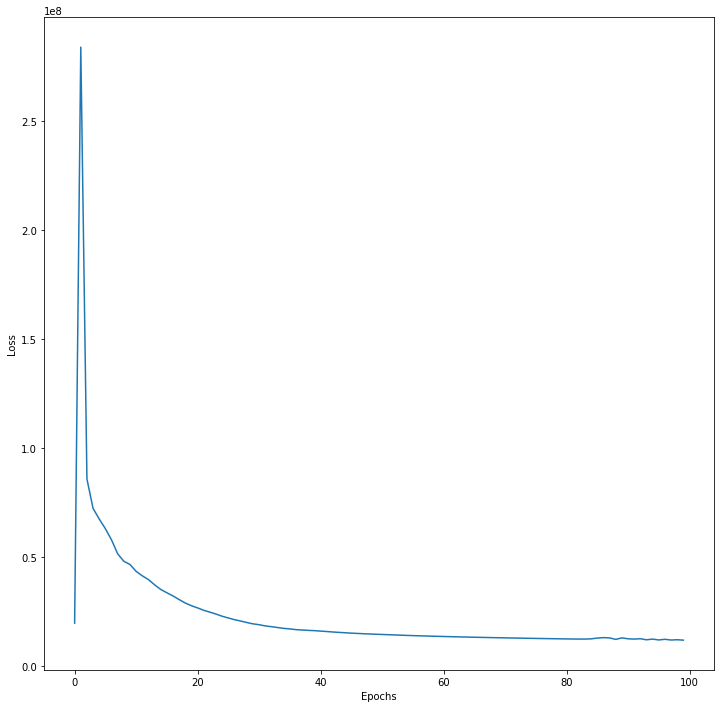

In [97]:
plt.plot(epoch_losses)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [98]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

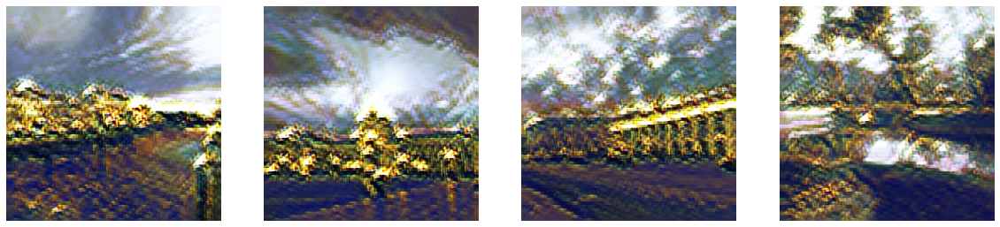

In [99]:
# Получившиеся при применении стиля
# Увеличение total_variation_weight привело к бОльшему размытию исходных картинок
# Больше потеряли в исходном содержании и стали больше похожи на картину художника.
plot_images_grid(styled_images,num_rows = 1)

In [100]:
# Оставим кол-во эпох и total_variation_weight, увеличим learning_rate
optimizer = tf.keras.optimizers.Adam(learning_rate=0.03)

In [101]:
epochs=100
content_weight=2*1e1
style_weight=1e2
# total_var_weight = [0.004, 0.05, 1, 3]
total_variation_weight=0.004

num_images=len(loader)
steps_per_epochs=num_images//batch_size
print(steps_per_epochs)

1


In [102]:
model_save_path="model_checkpoint_3"
os.makedirs(model_save_path,exist_ok=True)

In [103]:
epoch_losses=[]
for epoch in range(1,epochs+1):
    print(f"epoch: {epoch}")
    batch_loss=train_step(loader.dataset,style_activations,steps_per_epochs,style_model,loss_model,optimizer,
                          model_save_path,
                          content_weight,style_weight,total_variation_weight,
                          content_layers_weights,style_layers_weights)
    style_model.save_weights(os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print("Model Checkpointed at: ",os.path.join(model_save_path,"model_checkpoint.ckpt"))
    print(f"loss: {batch_loss.numpy()}")
    epoch_losses.append(batch_loss)

epoch: 1
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 11792540.0
epoch: 2
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 120099000.0
epoch: 3
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 148424704.0
epoch: 4
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 127069296.0
epoch: 5
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 125668904.0
epoch: 6
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 123701136.0
epoch: 7
Model Checkpoint Path:  model_checkpoint_3/model_c

Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 56629792.0
epoch: 54
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 53997144.0
epoch: 55
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 51165572.0
epoch: 56
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 50384920.0
epoch: 57
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 48696784.0
epoch: 58
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoint.ckpt
loss: 46489000.0
epoch: 59
Model Checkpoint Path:  model_checkpoint_3/model_checkpoint.ckpt
Model Checkpointed at:  model_checkpoint_3/model_checkpoin

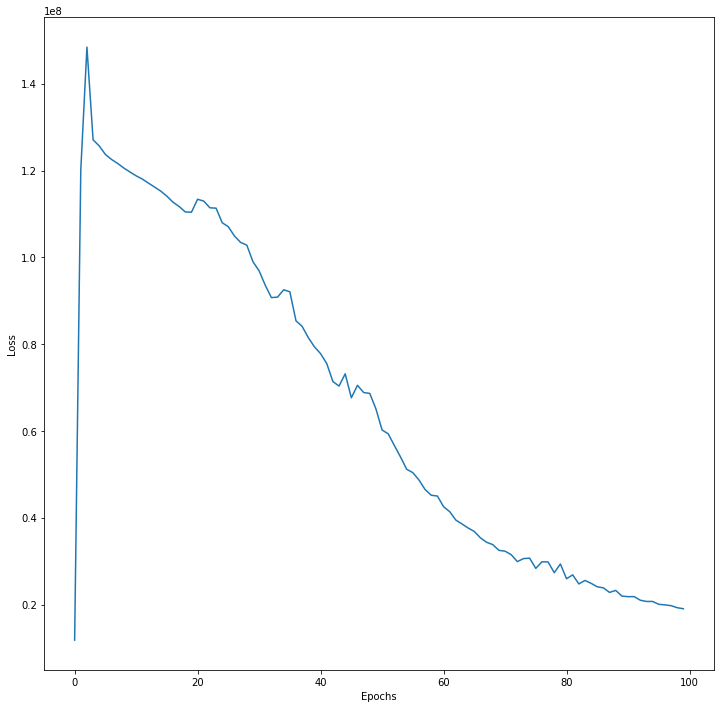

In [104]:
plt.plot(epoch_losses)
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.show()

In [105]:
styled_images = []

for images in loader.dataset.take(1):
    images = images * 255.0
    generated_images = style_model(images)
    generated_images = np.clip(generated_images,0,255)
    generated_images = generated_images.astype(np.uint8)
    for image in generated_images:
        styled_images.append(image)

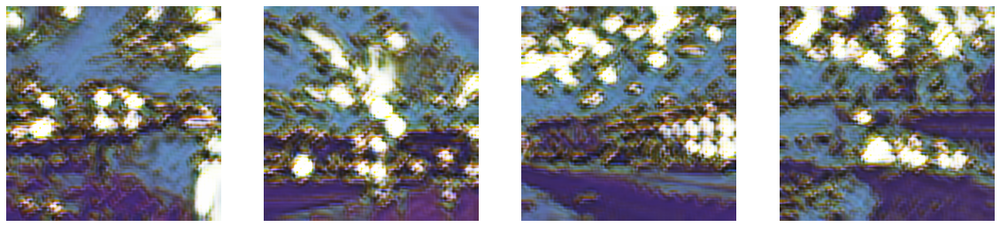

In [106]:
# Получившиеся при применении стиля
# Увеличение learning_rate до 0.03 также привело к бОльшему размытию исходных картинок
plot_images_grid(styled_images,num_rows = 1)